In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
import plotly.express as px
import plotly.graph_objects as go
import statsmodels as sm
from pathlib import Path
from sklearn.impute import SimpleImputer

In [2]:
df = pd.read_csv('Covid19_Vaccines_Cleaned.csv', encoding='utf8')
pd.set_option('display.max_columns', None)
df.head(10)
df = df[df.VAX_TYPE != "FLU4"]
df = df[df.VAX_TYPE != "FLUR4"]
df.head()

,Unnamed: 0,VAERS_ID,STATE,AGE_YRS,SEX,DIED,L_THREAT,ER_VISIT,HOSPITAL,HOSPDAYS,X_STAY,DISABLE,RECOVD,VAX_DATE,NUMDAYS,LAB_DATA,V_ADMINBY,OTHER_MEDS,CUR_ILL,HISTORY,PRIOR_VAX,BIRTH_DEFECT,OFC_VISIT,ER_ED_VISIT,ALLERGIES,Days_bf_Dead,VAX_TYPE,VAX_MANU,VAX_LOT,VAX_DOSE_SERIES,VAX_ROUTE,SYMPTOM1,SYMPTOM2,SYMPTOM3,SYMPTOM4,SYMPTOM5,total
0,0,916600,TX,33.0,0,0,0,0,0,0.0,0,0,1,2020-12-28,2.0,None,PVT,None,None,None,NaN,NaN,1.0,NaN,Pcn and bee venom,NaN,COVID19,MODERNA,037K20A,1,IM,Dysphagia,Epiglottitis,NaN,NaN,NaN,2
1,1,916601,CA,73.0,0,0,0,0,0,0.0,0,0,1,2020-12-31,0.0,NaN,SEN,Patient residing at nursing facility. See pati...,Patient residing at nursing facility. See pati...,Patient residing at nursing facility. See pati...,NaN,NaN,1.0,NaN,"""Dairy""",NaN,COVID19,MODERNA,025L20A,1,IM,Anxiety,Dyspnoea,NaN,NaN,NaN,2
2,2,916602,WA,23.0,0,0,0,0,0,0.0,0,0,U,2020-12-31,0.0,NaN,SEN,None,None,None,NaN,NaN,NaN,1.0,Shellfish,NaN,COVID19,PFIZER\BIONTECH,EL1284,1,IM,Chest discomfort,Dysphagia,Pain in extremity,Visual impairment,NaN,4
3,3,916603,WA,58.0,0,0,0,0,0,0.0,0,0,1,2020-12-23,0.0,none,WRK,none,kidney infection,"diverticulitis, mitral valve prolapse, osteoar...","got measles from measel shot, mums from mumps ...",NaN,NaN,NaN,"Diclofenac, novacaine, lidocaine, pickles, tom...",NaN,COVID19,MODERNA,NaN,NaN,NaN,Dizziness,Fatigue,Mobility decreased,NaN,NaN,3
4,4,916604,TX,47.0,0,0,0,0,0,0.0,0,0,0,2020-12-22,7.0,NaN,PUB,Na,Na,NaN,NaN,NaN,NaN,NaN,Na,NaN,COVID19,MODERNA,NaN,1,IM,Injection site erythema,Injection site pruritus,Injection site swelling,Injection site warmth,NaN,4


In [78]:
def plot_hist(df, col, xtitle, ytitle, title):
    fig = go.Figure(data=[go.Histogram(x=df[col])])
    fig.update_layout(title=title)
    fig.update_xaxes(title_text=xtitle)
    fig.update_yaxes(title_text=ytitle)
    fig.show()

In [80]:
fig = px.histogram(df, x="VAX_MANU", color="VAX_MANU")
fig.update_layout(xaxis={'categoryorder':'total descending'})
display(fig.show())

None

None

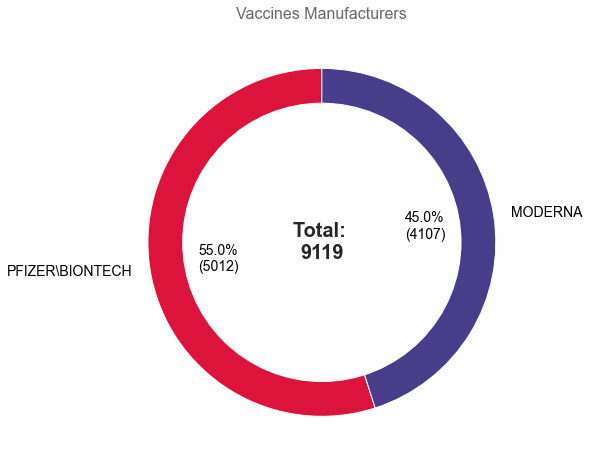

In [79]:
#MANUFACTURER

plot_hist(df, 'VAX_MANU', 'Vaccine', 'Count', 'Vaccine Manufacturers')
#PFIZER\BIONTECH and MODERNA's vaccine has the most number of cases where recievers were reported to have adverse reaction


fig = px.histogram(df, x="STATE", color="VAX_MANU")
fig.update_layout(xaxis={'categoryorder':'total descending'})
display(fig.show())

display(px.pie(df, names="VAX_MANU"))

# Importing libraries
from pycomp.viz.insights import *

# Variable rate
manufacturer_colors = ['crimson', 'darkslateblue', 'cyan', 'chartreuse', 'coral', 'magenta', 'dodgerblue', 'darkgreen', 'aquamarine', 'darkviolet']
plot_donut_chart(df=df, col='VAX_MANU',  colors=manufacturer_colors,
                 title='Vaccines Manufacturers')

In [8]:
fig = px.histogram(df, x="AGE_YRS", color="VAX_MANU")
fig.update_layout(xaxis={'categoryorder':'total descending'})
display(fig.show())

fig = px.histogram(df, x="SEX", color="VAX_MANU")
fig.update_layout(xaxis={'categoryorder':'total descending'})
display(fig.show())

None

None

In [10]:
# HOSPITALIZATION

fig = px.histogram(df, x="VAX_MANU", color="HOSPITAL")
fig.update_layout(
    title_text='Hospitalization per different Vaccine Manufacturer',
    xaxis_title_text='Vaccine', 
    yaxis_title_text='Count'
)
fig.show()

In [13]:
# RECOVERY

fig = px.histogram(df, x="VAX_MANU", color="RECOVD")
fig.update_layout(
    title_text='Recovery After Adverse Reactions',
    xaxis_title_text='Vaccine', 
    yaxis_title_text='Count'
)
fig.show()

In [14]:
# GENDER ANALYSIS

fig = px.histogram(df, x="VAX_MANU", color="SEX")
fig.update_layout(
    title_text='Gender Distribution in Vaccines',
    xaxis_title_text='Vaccine', 
    yaxis_title_text='Adverse Cases'
)
display(fig.show())

#Large number of women reported of reactions from PFIZER\BIONTECH and MODERNA vaccines.


# GENDER DISTRIBUTION OVERALL

fig = px.histogram(df, x="SEX", color="SEX")
fig.update_layout(
    title_text='Gender Distribution Overall',
    xaxis_title_text='Gender', 
    yaxis_title_text='Count'
)
display(fig.show())

#More than 50% of the recievers to experience adverse reaction from vaccines were females.
#Women are more likely to get adverse reaction from COVID vaccines.

None

None

In [16]:
fig8 = px.histogram(df, x="SEX", color="HOSPITAL")
fig8.update_layout(
    title_text='Hospitalization and Gender',
    xaxis_title_text='Gender', 
    yaxis_title_text='Count'
)

display(fig8.show())

fig8 = px.histogram(df, x="SEX", color="RECOVD")
fig8.update_layout(
    title_text='Recovery and Gender',
    xaxis_title_text='Gender', 
    yaxis_title_text='Count'
)

display(fig8.show())


None

None

In [19]:
fig8 = px.histogram(df, x="DIED", color="SEX")
fig8.update_layout(
    title_text='Died and Gender',
    xaxis_title_text='AGE', 
    yaxis_title_text='Count'
)

display(fig8.show())

None

In [17]:
#######

fig8 = px.histogram(df, x="total", color="SEX")
fig8.update_layout(
    title_text='Recovery After Adverse Reactions',
    xaxis_title_text='AGE', 
    yaxis_title_text='Count'
)

display(fig8.show())

None

In [24]:
# AGE

fig8 = px.histogram(df, x="AGE_YRS", color="HOSPITAL")
fig8.update_layout(
    title_text='Hodpitalization per Age',
    xaxis_title_text='AGE', 
    yaxis_title_text='Count'
)

display(fig8.show())

fig8 = px.histogram(df, x="AGE_YRS", color="RECOVD")
fig8.update_layout(
    title_text='Recovery per Age',
    xaxis_title_text='AGE', 
    yaxis_title_text='Count'
)

display(fig8.show())

fig8 = px.histogram(df, x="AGE_YRS", color="DIED")
fig8.update_layout(
    title_text='Died per Age',
    xaxis_title_text='AGE', 
    yaxis_title_text='Count'
)

display(fig8.show())

fig8 = px.histogram(df, x="AGE_YRS", color="SEX")
fig8.update_layout(
    title_text='Recovery After Adverse Reactions',
    xaxis_title_text='AGE', 
    yaxis_title_text='Count'
)

display(fig8.show())

None

None

None

None

In [29]:
# AGE DISTRIBUTION

fig = px.scatter(df, x="AGE_YRS", y="total", color="SEX")
fig.update_layout(
    title_text='Gender, number of Symptoms and Age',
    xaxis_title_text='Age',
    yaxis_title_text='Total Number of Symptoms'
)
display(fig.show())


fig = px.scatter(df, x="AGE_YRS", y="total", color="RECOVD")
fig.update_layout(
    title_text='Recovery, number of Symptoms and Age',
    xaxis_title_text='Age',
    yaxis_title_text='Total Number of Symptoms'
)
display(fig.show())

fig = px.scatter(df, x="AGE_YRS", y="total", color="HOSPITAL")
fig.update_layout(
    title_text='Hospitalization, number of Symptoms and Age',
    xaxis_title_text='Age',
    yaxis_title_text='Total Number of Symptoms'
)
display(fig.show())


None

None

None

In [81]:
fig = px.scatter(df, x="AGE_YRS", y="HOSPDAYS", color="HOSPITAL")
fig.update_layout(
    title_text='Hospitalization, number of days and Age',
    xaxis_title_text='Age',
    yaxis_title_text='Number of days'
)
display(fig.show())


fig = px.scatter(df, x="AGE_YRS", y="HOSPDAYS", color="SEX")
fig.update_layout(
    title_text='Hospitalization, number of days and Gender',
    xaxis_title_text='Age',
    yaxis_title_text='Number of days'
)
display(fig.show())

None

None

In [30]:
# SYMPTON

symptom1 = " ".join(df['SYMPTOM1'])
s2_dat = df['SYMPTOM2'].dropna().value_counts()
symptom2 = pd.DataFrame({"Symptom":s2_dat[:10].keys(), "Count":s2_dat[:10].values})
fig2 = px.bar(symptom2, x="Symptom", y="Count", title="Secondary Symptoms of Vaccination Reactions")
fig2.show()

#Maximum number of recipients tested positive for SARS-CoV-2
#Vaccination resulted to death of 166 recipients.

In [35]:
symptom2 = symptom2.append({"Symptom":"Other", "Count":s2_dat[10:].sum()}, ignore_index=True)
fig3 = px.pie(symptom2, names="Symptom", values="Count", title="Secondary Symptoms of Vaccination Reactions")
fig3.show()

In [36]:
fig2 = px.histogram(df, x="SYMPTOM1", color="SEX")
fig2.update_layout(
    title_text='Symptom',
    xaxis_title_text='Symptom', 
    yaxis_title_text='Count'
)
display(fig2.show())

fig3 = px.histogram(df, x="SYMPTOM1", color="RECOVD")
fig3.update_layout(
    title_text='Symptom',
    xaxis_title_text='Symptom', 
    yaxis_title_text='Count'
)
display(fig3.show())

fig2 = px.histogram(df, x="SYMPTOM1", color="HOSPITAL")
fig2.update_layout(
    title_text='Symptom',
    xaxis_title_text='Symptom', 
    yaxis_title_text='Count'
)
display(fig2.show())


None

None

None

In [42]:
fig3 = px.histogram(df, x="total", color="SEX")
fig3.update_layout(
    title_text='Symptom',
    xaxis_title_text='Total Symptom', 
    yaxis_title_text='Count'
)
display(fig3.show())

fig3 = px.histogram(df, x="total", color="HOSPITAL")
fig3.update_layout(
    title_text='Symptom',
    xaxis_title_text='Total Symptom', 
    yaxis_title_text='Count'
)
display(fig3.show())

fig3 = px.histogram(df, x="total", color="RECOVD")
fig3.update_layout(
    title_text='Symptom',
    xaxis_title_text='Total Symptom', 
    yaxis_title_text='Count'
)
display(fig3.show())

None

None

None

In [31]:
fig4 = px.histogram(df, x="V_ADMINBY", color="RECOVD")
fig4.update_layout(
    title_text='Vaccine Administred and Recovered',
    xaxis_title_text='Administration', 
    yaxis_title_text='Count'
)
display(fig4.show())

fig10 = px.histogram(df, x="V_ADMINBY", color="HOSPITAL")
fig10.update_layout(
    title_text='Vaccine Administration and Hospitalized',
    xaxis_title_text='Administration', 
    yaxis_title_text='Count'
)

display(fig10.show())

None

None

None

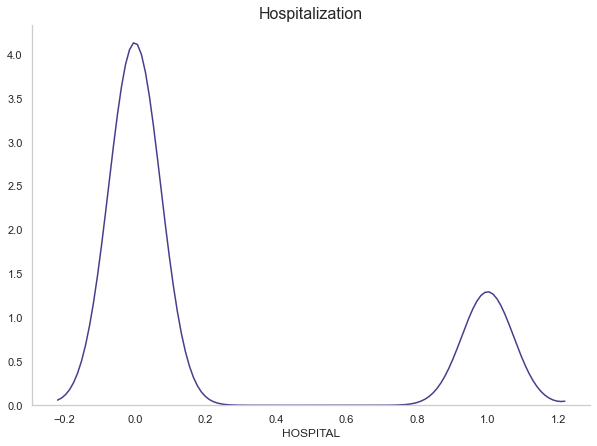

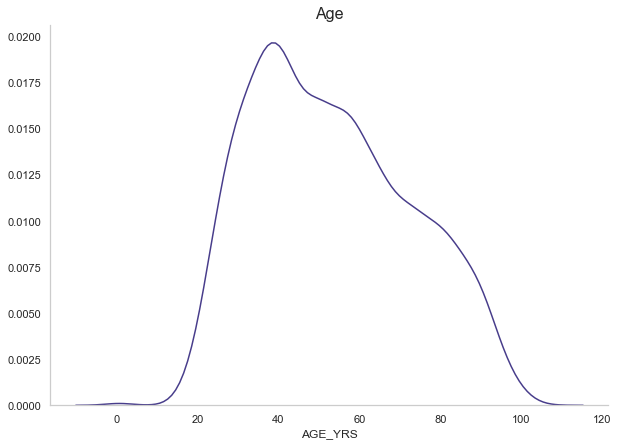

In [52]:
# Distribution of Hospital variable
plot_distplot(df=df, col='HOSPITAL', title="Hospitalization")

display(plot_distplot(df=df, col='AGE_YRS', title="Age"))


None

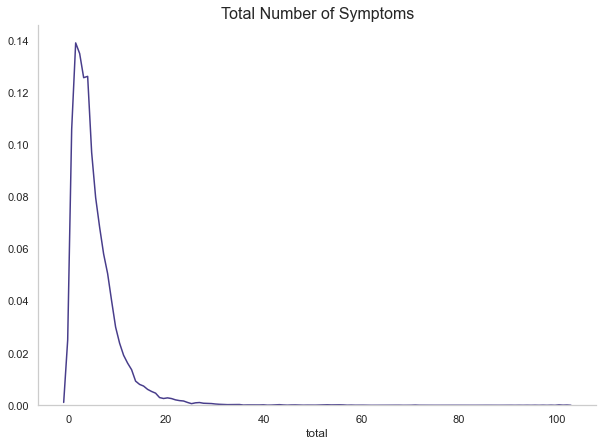

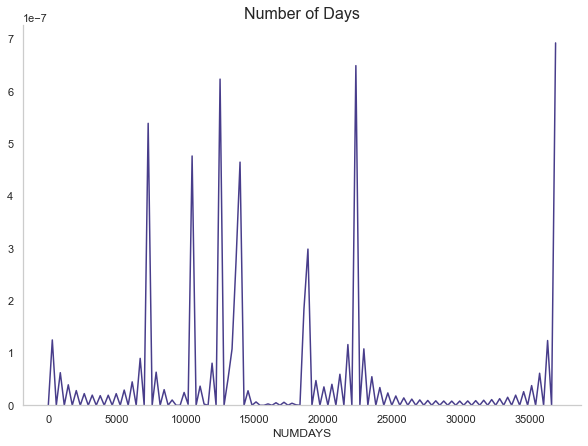

In [72]:
plot_distplot(df=df, col='total', title="Total Number of Symptoms")

display(plot_distplot(df=df, col='NUMDAYS', title="Number of Days"))
#NOTCLEANED

In [58]:
# Vaccination Route to Human Body
r = df['VAX_ROUTE'].value_counts()
route = pd.DataFrame({'Route':r.keys(), 'Count': r.values})
route_fig = px.pie(route, values="Count", names="Route", title="Vaccination Route to Human Body")
route_fig.update_layout(
    title_text='Vaccination Route to Human Body',
    xaxis_title_text='Route', 
    yaxis_title_text='Count',
)
route_fig.show()


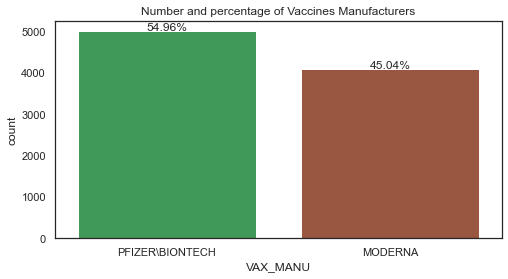

In [63]:
#Code from Gabriel Preda
#plt.style.use('dark_background')
def plot_count(feature, title, df, size=1):
    f, ax = plt.subplots(1,1, figsize=(4*size,4))
    total = float(len(df))
    g = sns.countplot(df[feature], order = df[feature].value_counts().index[:20], palette= ('#32a852', '#a84e32', '#3242a8'))
    g.set_title("Number and percentage of {}".format(title))
    if(size > 2):
        plt.xticks(rotation=90, size=8)
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x()+p.get_width()/2.,
                height + 3,
                '{:1.2f}%'.format(100*height/total),
                ha="center") 
    plt.show()
plot_count("VAX_MANU", "Vaccines Manufacturers", df,2)


In [68]:
# Distribution graphs (histogram/bar graph) of column data
def plotPerColumnDistribution(df, nGraphShown, nGraphPerRow):
    nunique = df.nunique()
    df = df[[col for col in df if nunique[col] > 1 and nunique[col] < 50]] # For displaying purposes, pick columns that have between 1 and 50 unique values
    nRow, nCol = df.shape
    columnNames = list(df)
    nGraphRow = (nCol + nGraphPerRow - 1) / nGraphPerRow
    plt.figure(num = None, figsize = (6 * nGraphPerRow, 8 * nGraphRow), dpi = 80, facecolor = 'w', edgecolor = 'k')
    for i in range(min(nCol, nGraphShown)):
        plt.subplot(nGraphRow, nGraphPerRow, i + 1)
        columnDf = df.iloc[:, i]
        if (not np.issubdtype(type(columnDf.iloc[0]), np.number)):
            valueCounts = columnDf.value_counts()
            valueCounts.plot.bar()
        else:
            columnDf.hist()
        plt.ylabel('counts')
        plt.xticks(rotation = 90)
        plt.title(f'{columnNames[i]} (column {i})')
    plt.tight_layout(pad = 1.0, w_pad = 1.0, h_pad = 1.0)
    plt.show()

# Correlation matrix
def plotCorrelationMatrix(df, graphWidth):
    #filename = df.dataframeName
    df = df.dropna('columns') # drop columns with NaN
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    if df.shape[1] < 2:
        print(f'No correlation plots shown: The number of non-NaN or constant columns ({df.shape[1]}) is less than 2')
        return
    corr = df.corr()
    plt.figure(num=None, figsize=(graphWidth, graphWidth), dpi=80, facecolor='w', edgecolor='k')
    corrMat = plt.matshow(corr, fignum = 1)
    plt.xticks(range(len(corr.columns)), corr.columns, rotation=90)
    plt.yticks(range(len(corr.columns)), corr.columns)
    plt.gca().xaxis.tick_bottom()
    plt.colorbar(corrMat)
    plt.title(f'Correlation Matrix for {filename}', fontsize=15)
    plt.show()

# Scatter and density plots
def plotScatterMatrix(df, plotSize, textSize):
    df = df.select_dtypes(include =[np.number]) # keep only numerical columns
    # Remove rows and columns that would lead to df being singular
    df = df.dropna('columns')
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    columnNames = list(df)
    if len(columnNames) > 10: # reduce the number of columns for matrix inversion of kernel density plots
        columnNames = columnNames[:10]
    df = df[columnNames]
    ax = pd.plotting.scatter_matrix(df, alpha=0.75, figsize=[plotSize, plotSize], diagonal='kde')
    corrs = df.corr().values
    for i, j in zip(*plt.np.triu_indices_from(ax, k = 1)):
        ax[i, j].annotate('Corr. coef = %.3f' % corrs[i, j], (0.8, 0.2), xycoords='axes fraction', ha='center', va='center', size=textSize)
    plt.suptitle('Scatter and Density Plot')
    plt.show()


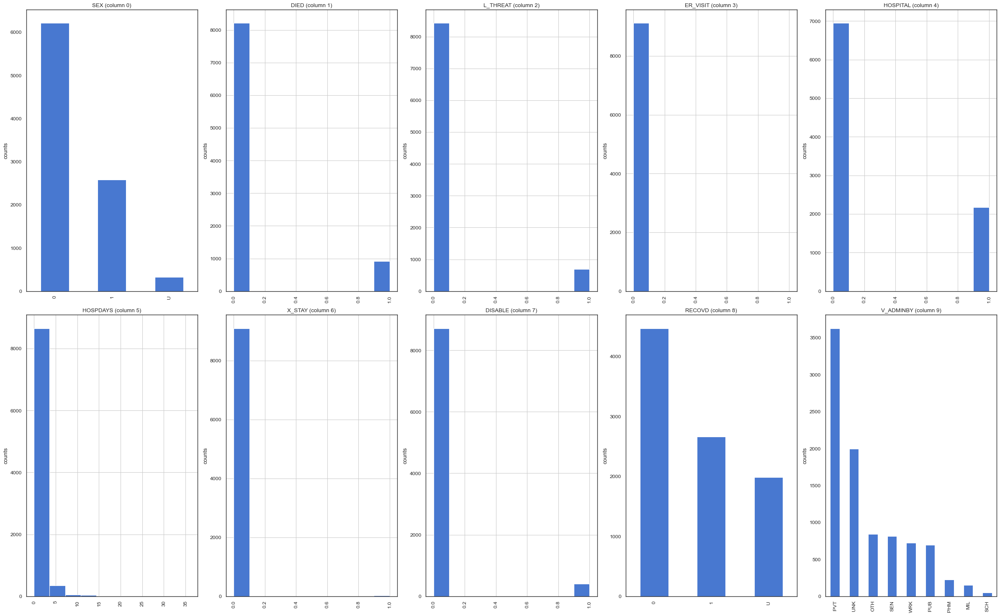

In [65]:
plotPerColumnDistribution(df, 10, 5)

NameError: name 'filename' is not defined

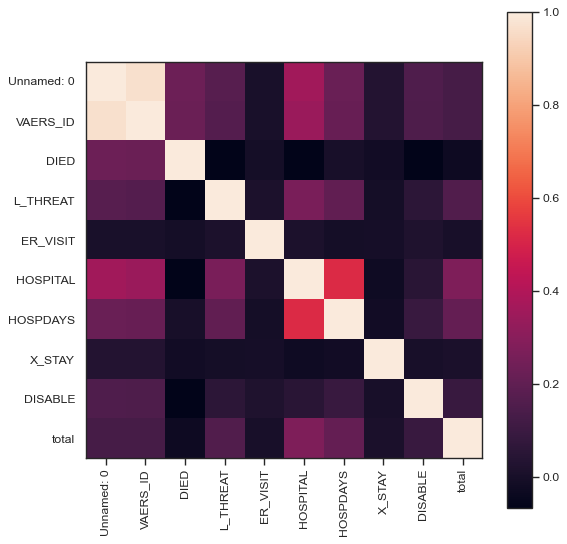

In [69]:
plotCorrelationMatrix(df, 8)

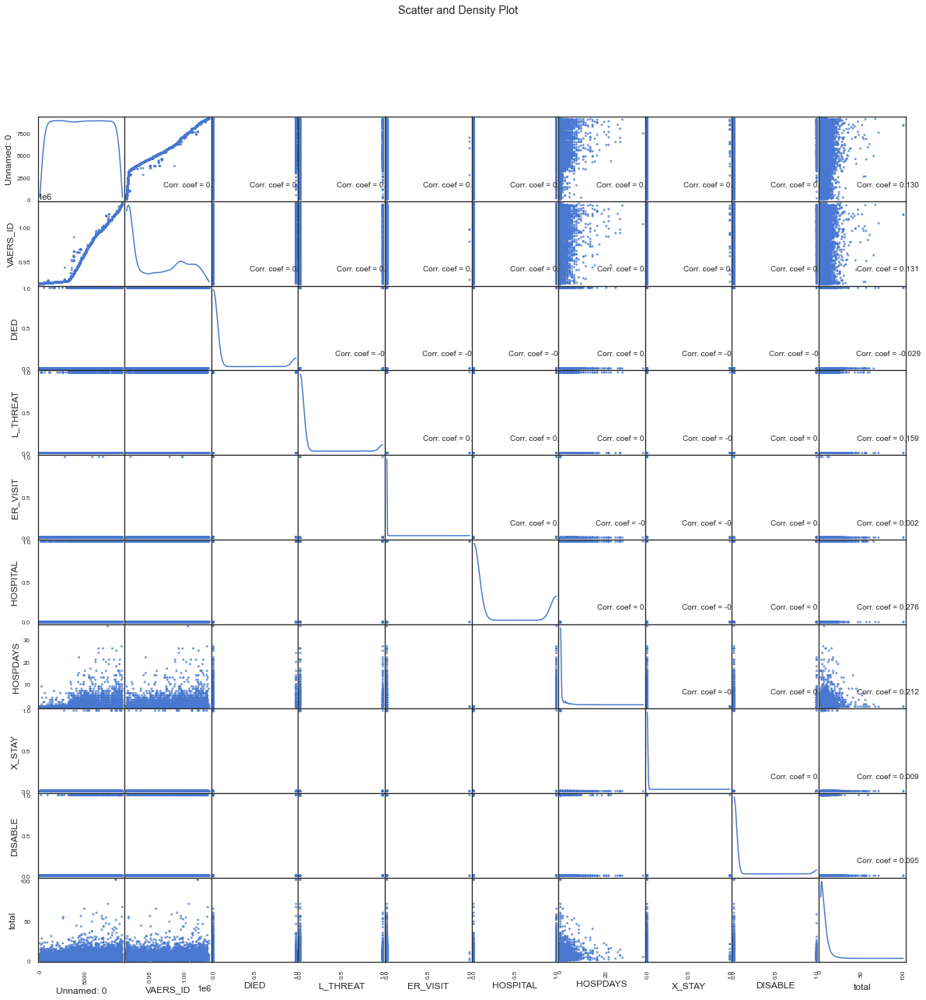

In [71]:
plotScatterMatrix(df, 20, 10)

In [73]:
fig8 = px.histogram(df, x="NUMDAYS", color="SEX")
fig8.update_layout(
    title_text='Died and Gender',
    xaxis_title_text='Number of Days', 
    yaxis_title_text='Count'
)

display(fig8.show())

#WE CANT USE NUMBER OF DAYS

None